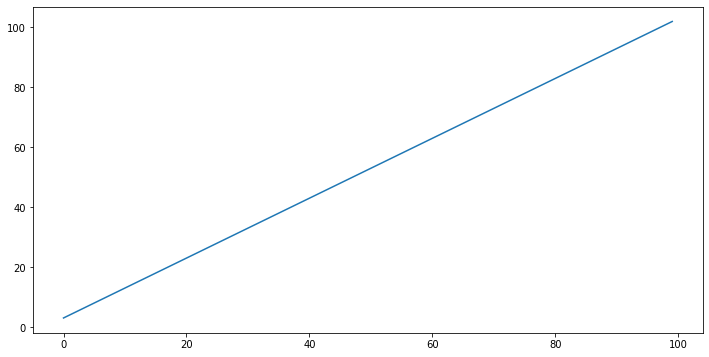

In [1]:
import numpy as np
from matplotlib import pyplot as plt
line = np.array([i + 3 for i in range(100)])
figure = plt.figure(figsize = (12,6))
plt.plot(line)

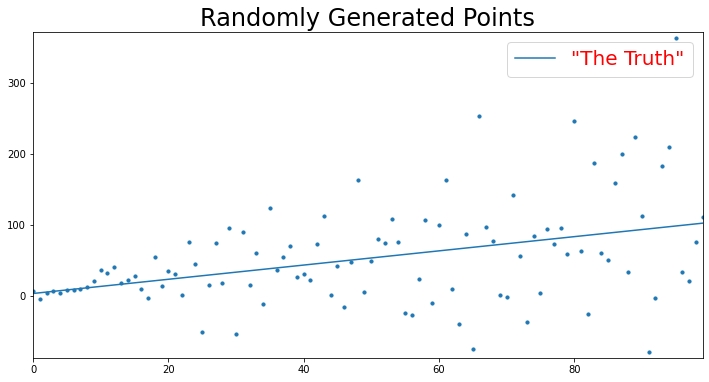

In [2]:
import random as random
points = []
for point in line:
    points.append(random.normalvariate(point,point))
    
plt.rcParams['axes.xmargin'] = 0
plt.rcParams['axes.ymargin'] = 0.02
    
figure = plt.figure(figsize = (12,6))
plt.plot(line)
plt.scatter(x = np.arange(len(points)), y = points, s = 10) # could use \n to stck words 
plt.title('Randomly Generated Points', fontsize = 24)
plt.legend(['\"The Truth\"'], fontsize =20, labelcolor = 'red')
plt.show()

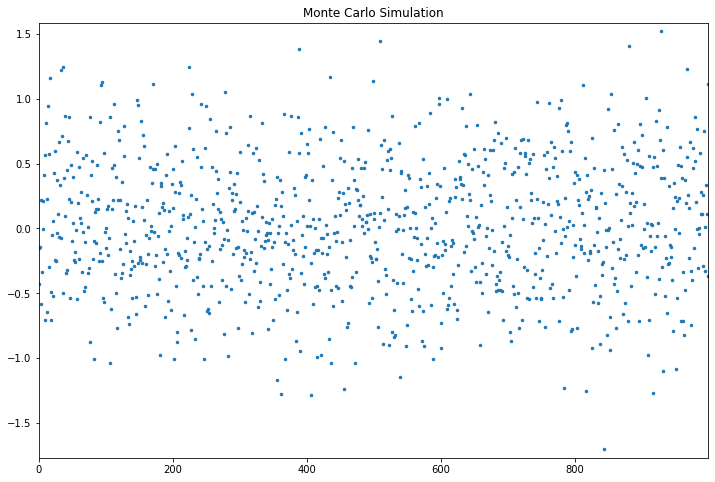

In [3]:
# montecarlo simulation
import numpy as np  
import pandas as pd
import matplotlib.pyplot as plt  
import random  

fig, ax = plt.subplots( figsize=(12, 8))
sim_length = 1000
random_list = []
for i in range (sim_length):
    random_list.append(random.normalvariate(0, .5))
    
plt.plot(random_list, ls = "", marker = ".", markersize = 5)
plt.title('Monte Carlo Simulation')
plt.show()
plt.close()

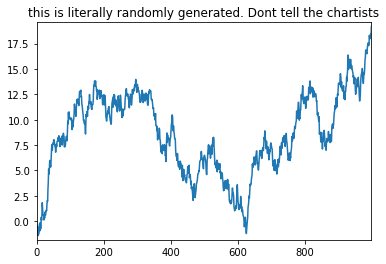

In [4]:
simulation = []

for i in range(len(random_list)): 
    val = random_list[i]
    if i == 0: 
        simulation.append(val)
    else: 
        simulation.append(simulation[i-1]+val)
        
plt.title('this is literally randomly generated. Dont tell the chartists')
plt.plot(simulation)

plt.show()
plt.close()

In [5]:
monte_carlo_sim_dict = {}
num_sims = 500
periods = 100
mean = 0
sigma = 1
for i in range(num_sims): 
    monte_carlo_sim_dict[i] = {}
    for period in range(periods): 
        curr_sim = monte_carlo_sim_dict[i]
        if period == 0: 
            curr_sim[period] = random.normalvariate(mean, sigma)
        else: 
            curr_sim[period] = curr_sim[period-1] + random.normalvariate(mean, sigma)
monte_carlo_sim_dict
monte_carlo_sim_df =  pd.DataFrame(monte_carlo_sim_dict)

<AxesSubplot:>

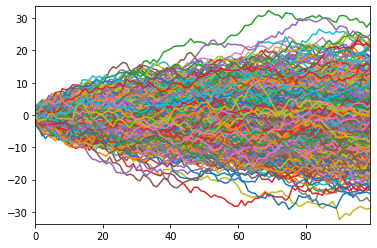

In [6]:
monte_carlo_sim_df.plot.line(legend = False)

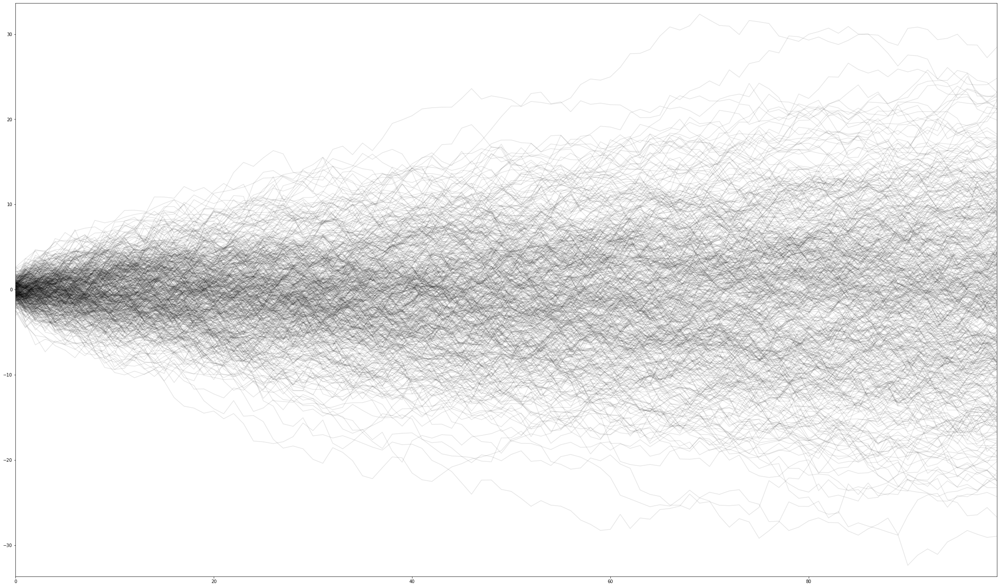

In [7]:
monte_carlo_sim_df =  pd.DataFrame(monte_carlo_sim_dict)
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, marker = ".", markersize = .1, 
                             color = "k", alpha = .1, ax = ax)
plt.show()
plt.close()

<AxesSubplot:ylabel='Frequency'>

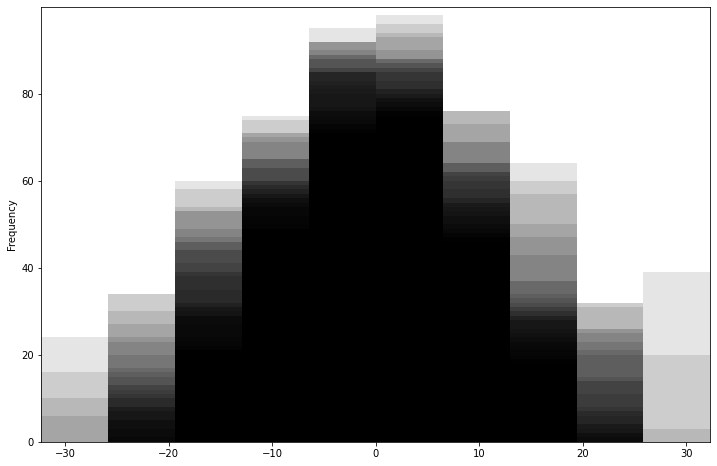

In [8]:
fig, ax = plt.subplots( figsize = (12, 8))
monte_carlo_sim_df.plot.hist(legend = False, 
                             color = "k", alpha = .1, ax = ax)

# Monte Carlo with a positive trend: 

In [9]:
def run_monte_carlo(mean, sigma, num_sims, sim_dict, index):
    
    for i in range(num_sims):
        sim_dict[i] = {}
        for ix in index:
            sim_dict[i][ix] = random.normalvariate(mean, sigma)

In [10]:
mean = .05
sigma = .5
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 2000
index = np.arange(periods)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)

monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).cumsum()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,-0.379607,0.479316,-0.410628,-0.596114,-0.059622,0.350145,-0.260004,-0.024602,0.238020,-0.523418,...,1.110222,0.037799,0.143514,0.943965,0.720600,0.551259,-0.662094,-0.119149,0.267391,0.531215
1,-0.523333,1.151608,-0.590455,-0.050673,-0.357993,1.169880,-1.060019,0.594022,0.202499,-0.491428,...,0.702785,0.089561,0.544982,1.091965,0.728580,1.402088,-0.362884,-0.236386,0.422705,0.274873
2,-1.284198,1.111910,0.043919,-1.034291,-0.916488,1.403796,-0.409458,-0.735486,0.452300,-0.259632,...,0.840379,0.080411,0.173242,0.768623,1.434285,1.298862,-0.441563,-0.631219,0.282298,-0.740800
3,-1.187441,0.748031,-0.381796,-0.825553,-0.741876,1.834829,-0.144454,-0.581229,-0.137338,0.291207,...,0.437876,-1.116784,0.071499,0.934490,0.916837,2.301177,-0.036569,-1.050570,0.278187,-0.869366
4,-1.956664,0.840143,-0.448276,-0.292787,-0.435446,2.340769,-1.060579,-0.385964,0.319726,-0.119134,...,1.272294,-0.660427,-0.323949,0.977817,0.749501,2.260330,-0.078869,-1.723929,0.379113,-0.258243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,114.628173,90.357105,94.584412,98.336258,110.499321,71.726925,87.184043,119.642448,105.726273,101.146246,...,110.853817,36.162947,111.178024,135.303154,75.680363,120.507710,67.737966,105.117172,88.402496,106.760358
1996,115.042717,90.464334,94.212961,98.977726,111.090398,72.544531,87.679686,120.136591,105.858548,101.547924,...,110.824670,36.364892,110.714054,135.830376,75.432170,120.092002,68.205190,105.631354,88.181902,106.481957
1997,115.614078,90.852142,94.243883,99.238710,110.915726,73.185927,88.301704,119.431376,106.539279,102.413979,...,109.879082,36.752194,111.342218,136.268904,74.930094,119.797916,69.104859,105.908637,88.311240,106.375731
1998,115.725285,89.620014,94.148508,99.338028,111.612353,74.237395,88.782574,119.962055,106.886122,102.833924,...,110.202738,36.155569,111.135796,137.009919,73.397711,120.044793,69.420613,106.229386,88.714861,106.598620


In [11]:
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).cumsum()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,-0.379607,0.479316,-0.410628,-0.596114,-0.059622,0.350145,-0.260004,-0.024602,0.238020,-0.523418,...,1.110222,0.037799,0.143514,0.943965,0.720600,0.551259,-0.662094,-0.119149,0.267391,0.531215
1,-0.523333,1.151608,-0.590455,-0.050673,-0.357993,1.169880,-1.060019,0.594022,0.202499,-0.491428,...,0.702785,0.089561,0.544982,1.091965,0.728580,1.402088,-0.362884,-0.236386,0.422705,0.274873
2,-1.284198,1.111910,0.043919,-1.034291,-0.916488,1.403796,-0.409458,-0.735486,0.452300,-0.259632,...,0.840379,0.080411,0.173242,0.768623,1.434285,1.298862,-0.441563,-0.631219,0.282298,-0.740800
3,-1.187441,0.748031,-0.381796,-0.825553,-0.741876,1.834829,-0.144454,-0.581229,-0.137338,0.291207,...,0.437876,-1.116784,0.071499,0.934490,0.916837,2.301177,-0.036569,-1.050570,0.278187,-0.869366
4,-1.956664,0.840143,-0.448276,-0.292787,-0.435446,2.340769,-1.060579,-0.385964,0.319726,-0.119134,...,1.272294,-0.660427,-0.323949,0.977817,0.749501,2.260330,-0.078869,-1.723929,0.379113,-0.258243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,114.628173,90.357105,94.584412,98.336258,110.499321,71.726925,87.184043,119.642448,105.726273,101.146246,...,110.853817,36.162947,111.178024,135.303154,75.680363,120.507710,67.737966,105.117172,88.402496,106.760358
1996,115.042717,90.464334,94.212961,98.977726,111.090398,72.544531,87.679686,120.136591,105.858548,101.547924,...,110.824670,36.364892,110.714054,135.830376,75.432170,120.092002,68.205190,105.631354,88.181902,106.481957
1997,115.614078,90.852142,94.243883,99.238710,110.915726,73.185927,88.301704,119.431376,106.539279,102.413979,...,109.879082,36.752194,111.342218,136.268904,74.930094,119.797916,69.104859,105.908637,88.311240,106.375731
1998,115.725285,89.620014,94.148508,99.338028,111.612353,74.237395,88.782574,119.962055,106.886122,102.833924,...,110.202738,36.155569,111.135796,137.009919,73.397711,120.044793,69.420613,106.229386,88.714861,106.598620


In [12]:
def plot_monte_carlo_sim(sim_data, title=None, logy=True):
    sim_data["mean"] = sim_data.mean(axis=1)
    fig, ax = plt.subplots(figsize=(24, 16))
    sim_data.drop("mean", inplace=False, axis=1).plot.line(legend=False,
                                                           marker=".",
                                                           markersize=.1,
                                                           color="k",
                                                           alpha=.05,
                                                           logy=logy,
                                                           ax=ax)
    sim_data["mean"].plot.line(legend=False,
                               color="C3",
                               linewidth=5,
                               logy=logy,
                               ax=ax)
    index = list(sim_data.index)

    plt.title(title, fontsize=50)
    plt.show()
    plt.close()


# sim_data["mean"].plot.line(legend = False, color="C3", linewidth=10, )

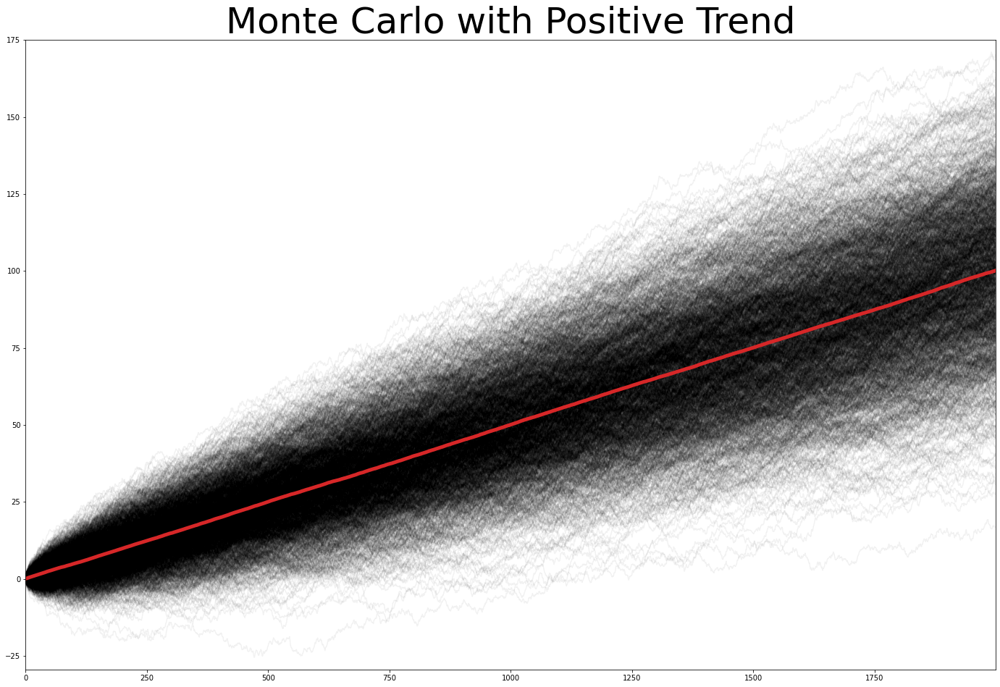

In [13]:
plot_monte_carlo_sim(monte_carlo_sim_df, title="Monte Carlo with Positive Trend", 
                    logy=False)

In [14]:
import pandas_datareader.data as web
import datetime

start = datetime.datetime(2005, 1, 1)
end = datetime.datetime.today()
data_dict = {}
stocks = ["MSFT", "AAPL", "IBM", "GOOG"]
for stock in stocks:
    data_dict[stock] = web.DataReader(stock, 'yahoo', start, end)
data_dict

{'MSFT':                   High         Low        Open       Close       Volume  \
 Date                                                                      
 2005-01-03   26.950001   26.650000   26.799999   26.740000   65002900.0   
 2005-01-04   27.100000   26.660000   26.870001   26.840000  109442100.0   
 2005-01-05   27.100000   26.760000   26.840000   26.780001   72463500.0   
 2005-01-06   27.059999   26.639999   26.850000   26.750000   76890500.0   
 2005-01-07   26.889999   26.620001   26.820000   26.670000   68723300.0   
 ...                ...         ...         ...         ...          ...   
 2021-11-26  337.929993  328.119995  334.350006  329.679993   24217200.0   
 2021-11-29  339.029999  334.739990  334.940002  336.630005   28563500.0   
 2021-11-30  337.779999  328.989990  335.320007  330.589996   42885600.0   
 2021-12-01  339.279999  329.390015  335.130005  330.079987   33337600.0   
 2021-12-02  333.470001  327.820007  330.299988  330.769989    9096358.0   
 
  

In [15]:
close_data_dict = {key:val["Close"] for key, val in data_dict.items()}

In [16]:
close_data_dict
close_data_df = pd.DataFrame(close_data_dict)

In [17]:
close_data_df

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,26.740000,1.130179,93.451241,100.976517
2005-01-04,26.840000,1.141786,92.447418,96.886841
2005-01-05,26.780001,1.151786,92.256210,96.393692
2005-01-06,26.750000,1.152679,91.969406,93.922951
2005-01-07,26.670000,1.236607,91.567879,96.563057
...,...,...,...,...
2021-11-26,329.679993,156.809998,115.809998,2856.120117
2021-11-29,336.630005,160.240005,118.500000,2922.280029
2021-11-30,330.589996,165.300003,117.099998,2849.040039


In [18]:
close_data_pct_change = close_data_df.pct_change()
close_data_pct_change

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,NaN,NaN,NaN,NaN
2005-01-04,0.003740,0.010270,-0.010742,-0.040501
2005-01-05,-0.002235,0.008758,-0.002068,-0.005090
2005-01-06,-0.001120,0.000775,-0.003109,-0.025632
2005-01-07,-0.002991,0.072811,-0.004366,0.028109
...,...,...,...,...
2021-11-26,-0.024356,-0.031678,-0.007881,-0.026660
2021-11-29,0.021081,0.021874,0.023228,0.023164
2021-11-30,-0.017943,0.031578,-0.011814,-0.025063


In [19]:
close_data_pct_change.fillna(0, inplace=True)
close_data_normalized = close_data_pct_change.add(1).cumprod()
close_data_normalized

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499
2005-01-05,1.001496,1.019118,0.987212,0.954615
2005-01-06,1.000374,1.019908,0.984143,0.930146
2005-01-07,0.997382,1.094169,0.979847,0.956292
...,...,...,...,...
2021-11-26,12.329095,138.747925,1.239256,28.284993
2021-11-29,12.589006,141.782849,1.268041,28.940194
2021-11-30,12.363126,146.260014,1.253060,28.214877


<AxesSubplot:xlabel='Date'>

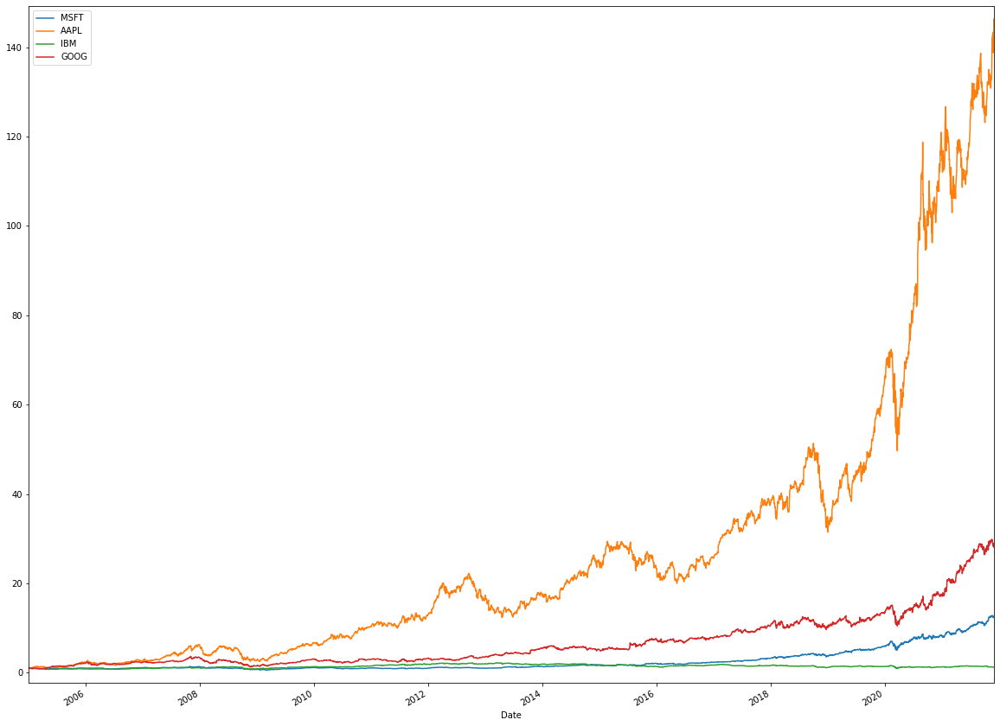

In [20]:
fig, ax = plt.subplots(figsize=(20, 16))
close_data_normalized.plot.line(ax=ax)

<AxesSubplot:xlabel='Date'>

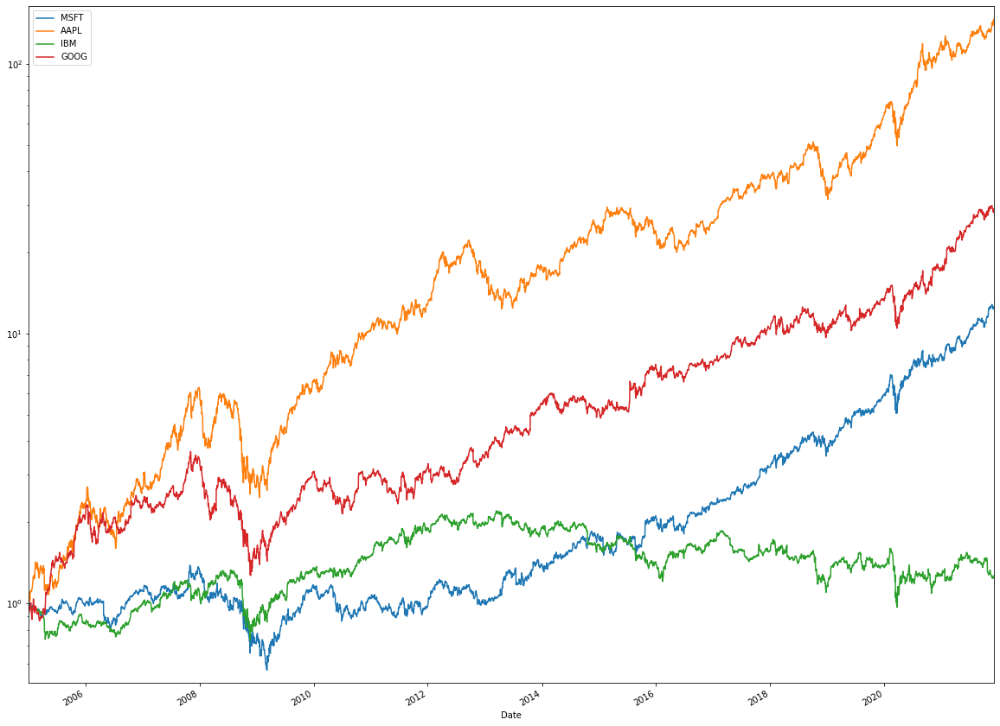

In [21]:
fig, ax = plt.subplots(figsize=(20, 16))
close_data_normalized.plot.line(ax=ax, logy=True)

In [22]:
FV = close_data_normalized.iloc[-1]
PV = close_data_normalized.iloc[0]
R = FV.div(PV)
t = close_data_normalized["MSFT"].count()

In [23]:
mean_var_df = pd.DataFrame({
    "mean": R**(1 / t) - 1,
    "sigma": close_data_pct_change.std()
})
mean_var_df

,mean,sigma
MSFT,0.000591,0.017053
AAPL,0.001165,0.020769
IBM,0.000054,0.014583
GOOG,0.000785,0.018615


In [24]:
num_sims = 500
dates = list(close_data_df.index)
monte_carlo_sim_dict = {}
for stock in stocks:
    monte_carlo_sim_dict[stock] = {}
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock]
    run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict[stock], dates)

monte_carlo_sim_dfs = {
    stock: pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod()
    for stock in stocks
}

In [25]:
monte_carlo_sim_dfs

{'MSFT':                   0         1          2           3          4         5    \
 2005-01-03   0.997125  1.005038   1.010737    0.990573   1.012704  1.008536   
 2005-01-04   0.987383  0.991791   0.971944    0.986759   0.990802  1.025562   
 2005-01-05   0.990946  1.008141   0.976438    0.977641   0.989950  1.016993   
 2005-01-06   0.977409  1.004187   0.976323    0.990477   1.020057  0.987247   
 2005-01-07   0.980886  0.993288   0.994176    0.983158   1.005628  1.015592   
 ...               ...       ...        ...         ...        ...       ...   
 2021-11-26  17.019410  3.798333  47.702612  156.977012  47.956048  4.075221   
 2021-11-29  16.477731  3.871034  45.952326  155.395447  47.706909  4.157638   
 2021-11-30  16.163581  3.978085  45.968473  155.839538  48.556995  4.124941   
 2021-12-01  16.122706  3.987761  45.982875  157.712025  49.336251  4.120164   
 2021-12-02  16.286195  3.949535  46.049281  159.502072  49.220384  4.130336   
 
                   6         7

In [26]:
def plot_monte_carlo_sim(sim_data, observed_data=None, title=None, logy=True):
    sim_data["mean"] = sim_data.mean(axis=1)
    index = sim_data.index
    fig, ax = plt.subplots(figsize=(40, 24))
    sim_data.drop(["mean"], inplace=False, axis=1).plot.line(legend=False,
                                                             marker=".",
                                                             markersize=.1,
                                                             color="k",
                                                             alpha=.05,
                                                             logy=logy,
                                                             ax=ax)
    if observed_data is not None:
        observed_data.plot.line(legend=False,
                                color="C1",
                                linewidth=5,
                                logy=logy,
                                ax=ax)

        obs_text_x = observed_data[observed_data == observed_data.min()].index
        plt.text(obs_text_x,
                 observed_data.loc[obs_text_x] * .7,
                 "Observed",
                 fontsize=70,
                 color="C1")
    sim_data["mean"].plot.line(legend=False,
                               color="C3",
                               linewidth=5,
                               logy=logy,
                               ax=ax)
    plt.text(index[-400],
             sim_data["mean"].iloc[-400] * 1.5,
             "Exp\nVal",
             fontsize=70,
             color="C3")

    plt.title(title, fontsize=50)
    plt.show()
    plt.close()


monte_carlo_sim_dfs[stock].median(axis=1)

2005-01-03     1.000355
2005-01-04     1.000552
2005-01-05     1.001762
2005-01-06     1.003536
2005-01-07     1.004192
                ...    
2021-11-26    13.667834
2021-11-29    13.615004
2021-11-30    13.445780
2021-12-01    13.331434
2021-12-02    13.516534
Length: 4260, dtype: float64

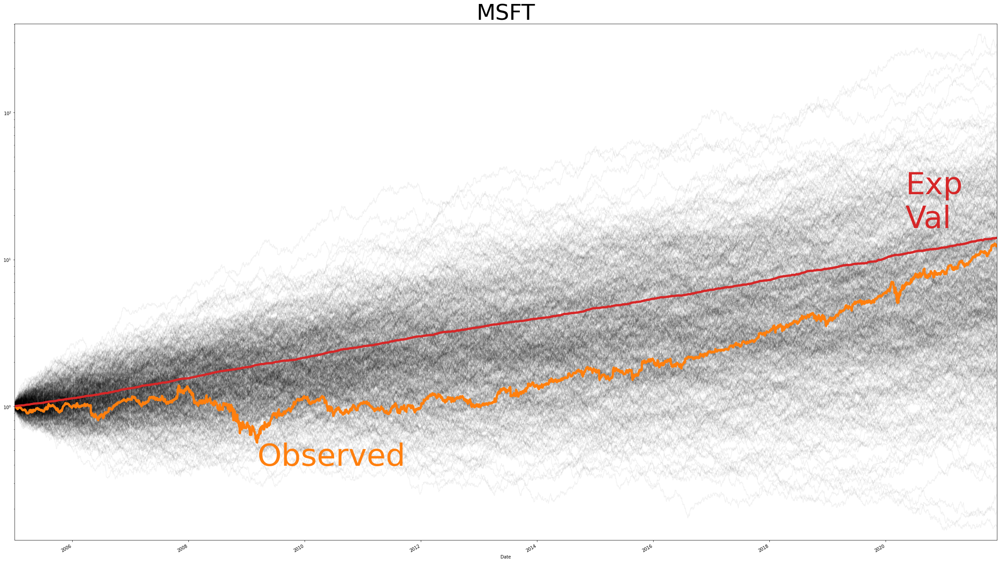

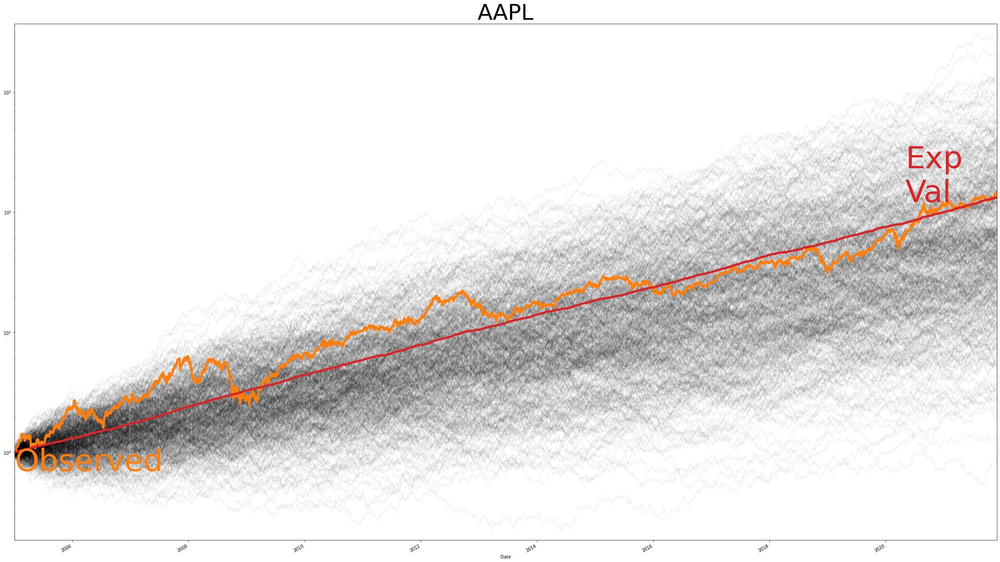

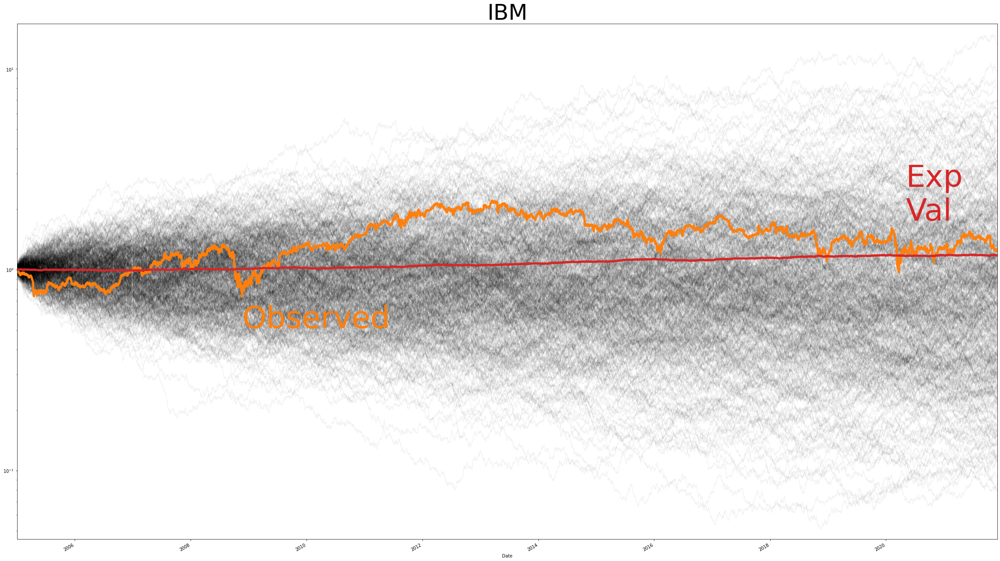

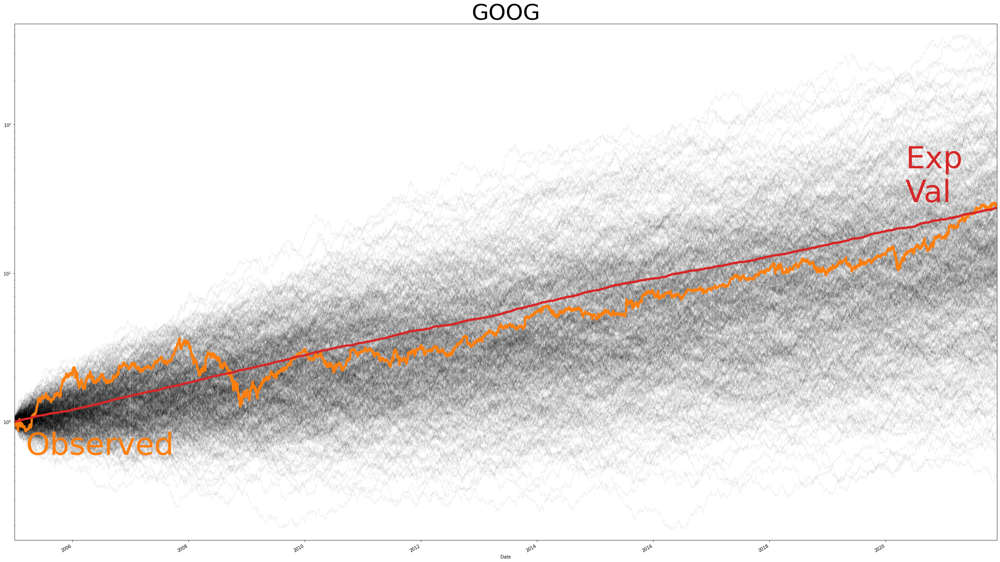

In [27]:
for stock in stocks:
    plot_monte_carlo_sim(monte_carlo_sim_dfs[stock], close_data_normalized[stock], stock, logy= True)

# Calculate expected returns

In [28]:
portfolio_weights = {stock: 1/len(stocks) for stock in stocks}
portfolio_weights

{'MSFT': 0.25, 'AAPL': 0.25, 'IBM': 0.25, 'GOOG': 0.25}

In [29]:
ex_return = pd.DataFrame(close_data_normalized.apply(
    lambda x: x.mul(portfolio_weights[x.name]), axis=0).sum(axis=1),
                         columns=["Portfolio Return"])

In [31]:
close_data_normalized["Portfolio Return"] = ex_return

In [32]:
close_data_normalized

,MSFT,AAPL,IBM,GOOG,Portfolio Return
Date,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499,0.990692
2005-01-05,1.001496,1.019118,0.987212,0.954615,0.990610
2005-01-06,1.000374,1.019908,0.984143,0.930146,0.983643
2005-01-07,0.997382,1.094169,0.979847,0.956292,1.006923
...,...,...,...,...,...
2021-11-26,12.329095,138.747925,1.239256,28.284993,45.150317
2021-11-29,12.589006,141.782849,1.268041,28.940194,46.145023
2021-11-30,12.363126,146.260014,1.253060,28.214877,47.022769


<AxesSubplot:xlabel='Date'>

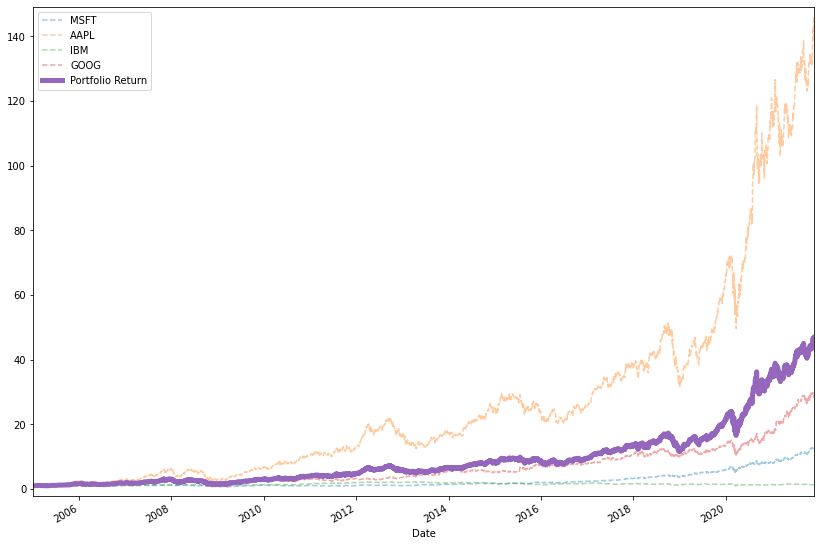

In [41]:
fig, ax = plt.subplots(figsize=(14, 10))
close_data_normalized.drop(["Portfolio Return"],
                           axis=1).plot.line(legend=True,
                                             linestyle='--',
                                             alpha=.4,
                                             ax=ax)
close_data_normalized[["Portfolio Return"]].plot.line(linewidth=5, ax=ax)

In [51]:
ex_return_pct_change = ex_return.pct_change().dropna()
ex_return_pct_change

,Portfolio Return
Date,
2005-01-04,-0.009308
2005-01-05,-0.000082
2005-01-06,-0.007033
2005-01-07,0.023667
2005-01-10,0.001298
...,...
2021-11-26,-0.030239
2021-11-29,0.022031
2021-11-30,0.019021


In [52]:
t = ex_return["Portfolio Return"].count()
PV = ex_return.iloc[0]
FV = ex_return.iloc[-1]
mean_var_df = pd.DataFrame({
    "mean": (FV / PV)**(1 / t) - 1,
    "sigma": ex_return_pct_change.std()
})

In [53]:
mean_var_df

,mean,sigma
Portfolio Return,0.0009,0.016472


In [54]:
num_sims = 1000
dates = ex_return.index
monte_carlo_sim_dict = {}
mean = mean_var_df["mean"]["Portfolio Return"]
sigma = mean_var_df["sigma"]["Portfolio Return"]
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, dates)
monte_carlo_sim_df= pd.DataFrame(monte_carlo_sim_dict).add(1).cumprod()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
2005-01-03,1.034656,1.016588,1.004284,1.008825,1.017009,0.989909,0.965250,1.007559,1.012817,1.019932,...,1.018852,1.001637,0.982959,1.027986,1.016024,0.993058,1.026567,0.993621,0.995110,1.013166
2005-01-04,1.016752,1.020571,1.005538,1.019856,1.010627,0.984987,0.965724,0.991032,0.999231,0.996227,...,1.010925,0.985913,0.986389,1.047622,1.020106,0.993613,1.001665,1.007976,0.987396,1.003721
2005-01-05,1.019453,0.993299,0.996839,1.007860,1.007849,1.020013,0.972423,1.009953,1.027467,1.032358,...,1.013419,1.010577,0.993382,1.060740,1.034975,0.973136,0.995019,1.018974,0.973599,1.007930
2005-01-06,1.037825,1.008753,0.973065,1.011966,0.996414,1.027246,0.975292,1.013783,1.038217,1.055756,...,1.002682,1.025116,0.996369,1.064086,1.026231,0.984816,0.998957,1.015946,0.992456,1.002924
2005-01-07,1.026620,1.009758,0.966879,1.040802,0.985416,1.031821,0.994955,1.038649,1.035331,1.069966,...,1.020763,1.054109,0.991093,1.069540,1.017534,0.983771,1.022278,0.993822,0.973301,1.015801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-26,17.928744,65.989456,9.021783,71.631196,32.137959,19.296987,10.577459,18.572868,20.376757,20.177639,...,20.094253,334.204256,16.035512,119.368881,14.072740,15.762164,23.571980,13.708871,10.611876,29.354691
2021-11-29,17.996959,66.117878,9.058264,72.607323,32.658774,19.319064,10.325029,18.944784,20.515018,20.827188,...,19.747478,341.659437,15.761943,121.961798,13.737506,16.010054,23.958447,14.069156,10.515102,29.546292
2021-11-30,17.885381,67.525324,9.130092,72.784092,32.331609,19.380246,10.414936,19.228702,20.659306,20.815506,...,20.207691,335.923673,16.145862,122.224474,14.077238,16.334804,24.134584,14.380308,10.763139,29.907073
2021-12-01,17.925335,66.658256,9.122341,71.364390,31.890187,19.657402,10.291280,20.146616,20.156816,20.855997,...,20.287675,335.898793,16.022457,122.088013,14.094594,16.248880,24.452462,14.669496,10.945858,30.025167


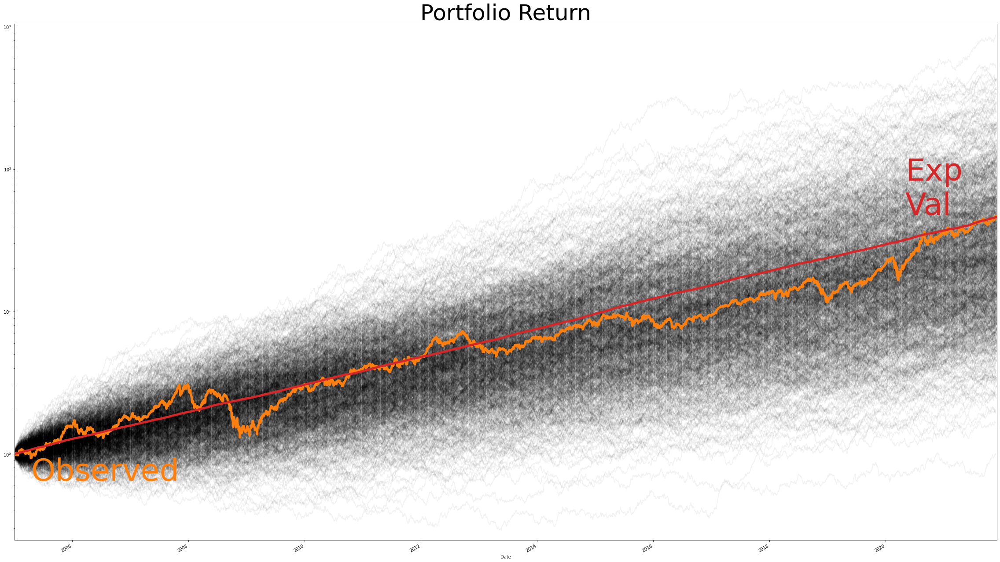

In [55]:
plot_monte_carlo_sim(monte_carlo_sim_df, ex_return["Portfolio Return"], "Portfolio Return", logy=True)